# **EN3160 Assignment 01**



*   M.P.D.N. Wickramasingha
*   Index No : 210705E
*   Github Respository :







### **Connecting Google Drive**

In [121]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Import Libraries**

In [122]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math


## **01) Intensity Transformation**

### **Function of Transformation**

In [123]:
# Define the intensity transformation function
def intensity_transformation(pixel_value):
    x = pixel_value
    if x <= 50:
        # Range 1: y = x
        return x
    elif 50 < x <= 150:
        # Range 2: Linear transformation between 50 and 150
        m = 1.55
        c = 100 - m * 50
        return m * x + c
    else:
        # Range 3: Linear transformation between 150 and 255
        return x

### **Apply Transformaion to Picture**

In [124]:
# Apply the transformation to an image
def apply_transformation(image):
    # Vectorize the intensity transformation function for performance
    vectorized_transformation = np.vectorize(intensity_transformation)

    # Apply the transformation
    transformed_image = vectorized_transformation(image)

    # Convert the transformed image back to uint8 type (0-255)
    transformed_image = np.clip(transformed_image, 0, 255).astype(np.uint8)

    return transformed_image

# Load the image (assuming a grayscale image for simplicity)
image = cv2.imread('/content/drive/MyDrive/a1images/emma.jpg', cv2.IMREAD_GRAYSCALE)

# Apply the transformation
transformed_image = apply_transformation(image)


### **Show the Result**

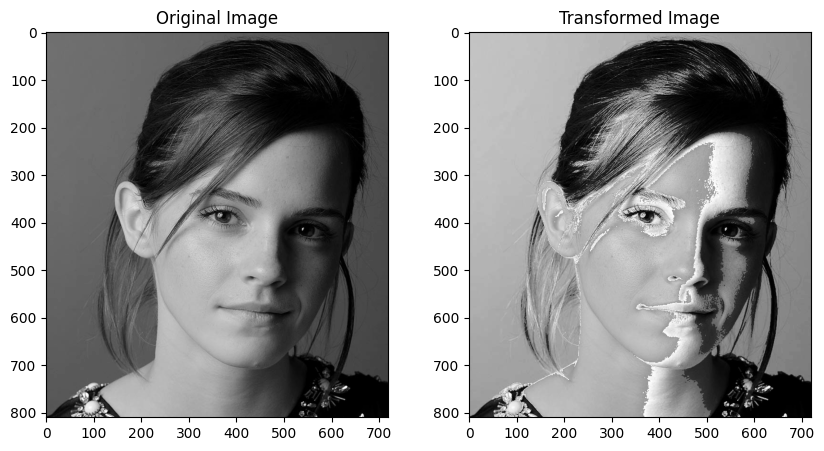

In [125]:
# Display original and transformed images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Transformed Image')
plt.imshow(transformed_image, cmap='gray')

plt.show()

## **02) Intensity Transformation for Brain**

### **Original Image & Random intensities of White and Gray matter of brain**

Intensity at (100, 125) - White Matter: 224
Intensity at (80, 145) - Gray Matter: 165


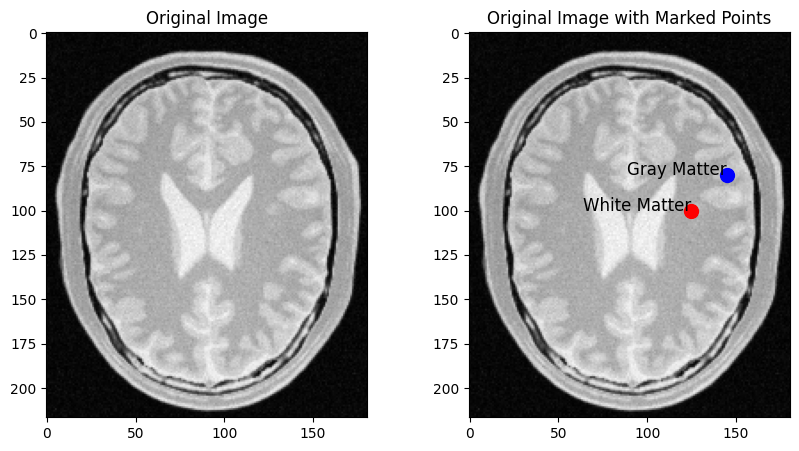

In [126]:
image = cv2.imread('/content/drive/MyDrive/a1images/brain_proton_density_slice.png', cv2.IMREAD_GRAYSCALE)

# Print intensity values at (50, 100) and (25, 100)
x1, y1 = 100, 125
x2, y2 = 80, 145

print(f"Intensity at (100, 125) - White Matter: {image[y1, x1]}")
print(f"Intensity at (80, 145) - Gray Matter: {image[y2, x2]}")

# Plot the image and mark the points
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Original Image with Marked Points')
plt.imshow(image, cmap='gray')

plt.scatter(y1, x1, color='red', s=100, label="Point (50, 100)")
plt.scatter(y2, x2, color='blue', s=100, label="Point (25, 100)")


# Add labels to the points
plt.text(y1, x1, 'White Matter', color='black', fontsize=12, ha='right')
plt.text(y2, x2, 'Gray Matter', color='black', fontsize=12, ha='right')

# Show the plot
plt.show()


### **Histogram of the Image**

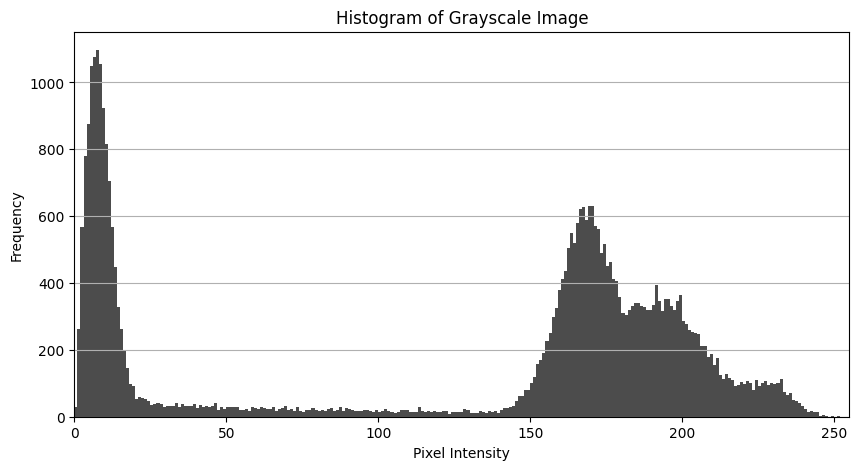

In [127]:
# Plot the histogram
plt.figure(figsize=(10, 5))
plt.hist(image.ravel(), bins=256, range=[0, 256], color='black', alpha=0.7)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.xlim([0, 255])
plt.show()


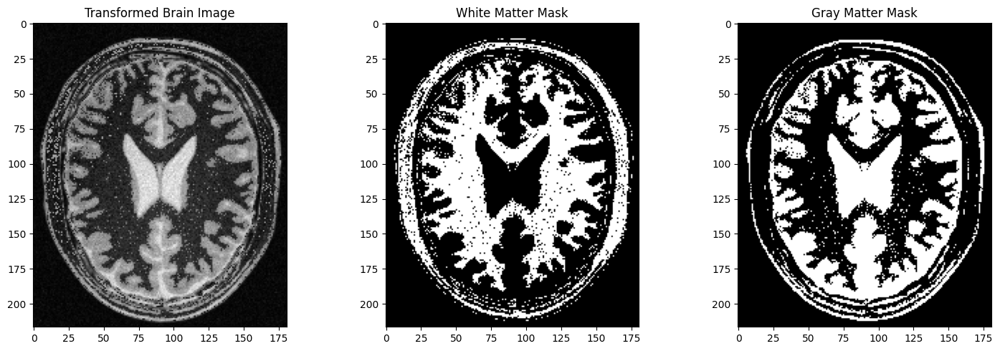

In [135]:
# Function to transform pixel intensities for white and gray matter
def Intensity_transform(image):
    # Create a copy of the image to apply transformations
    transformed_image = np.copy(image)

    # Apply transformation for white matter (150 <= pixel <= 250) # gray matter is brigher than white
    gray_matter_mask = (image >= 181) & (image <= 255)
    transformed_image[gray_matter_mask] = 1.8 * image[gray_matter_mask] + 35

    # Apply transformation for gray matter (50 <= pixel <= 150) # white matter is darker than gray
    white_matter_mask = (image >= 150) & (image <= 180)
    transformed_image[white_matter_mask] = 1.6 * image[white_matter_mask] + 25


    return transformed_image, white_matter_mask, gray_matter_mask

# Apply the transformation to the brain image
transformed_brain_img, white_matter_mask, gray_matter_mask = Intensity_transform(image)

# Create a single figure for all three images
plt.figure(figsize=(15 , 5))

# Display the transformed brain image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, 1st subplot
plt.imshow(transformed_brain_img, cmap='gray')
plt.title("Transformed Brain Image")

# Display the white matter mask
plt.subplot(1, 3, 2)  # 1 row, 3 columns, 2nd subplot
plt.imshow(white_matter_mask, cmap='gray')
plt.title("White Matter Mask")

# Display the gray matter mask
plt.subplot(1, 3, 3)  # 1 row, 3 columns, 3rd subplot
plt.imshow(gray_matter_mask, cmap='gray')
plt.title("Gray Matter Mask")

# Show the plots
plt.tight_layout()
plt.show()


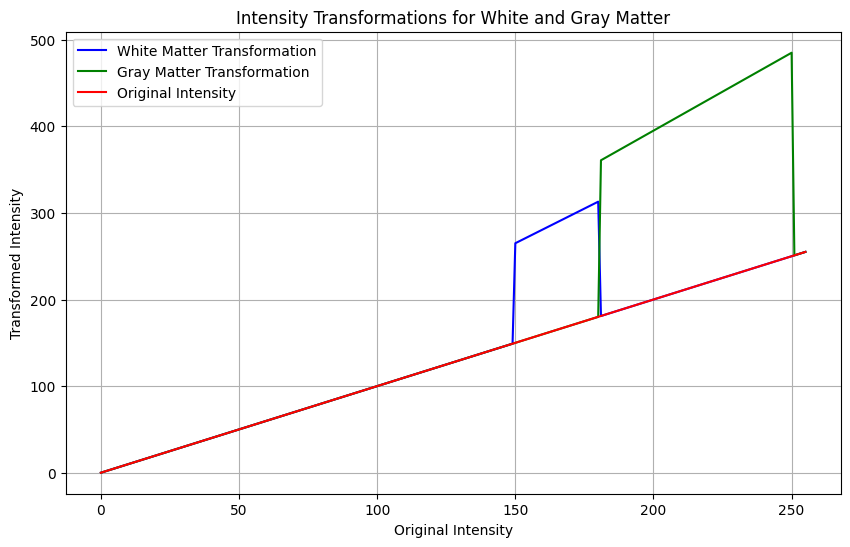

In [136]:
# Plot intensity transformation curves
x_vals = np.arange(0, 256)  # Intensity range (0-255)
gray_matter_transformed = np.array([1.8 * x + 35 if 181 <= x <= 250 else x for x in x_vals])
white_matter_transformed = np.array([1.6 * x + 25 if 150 <= x <= 180 else x for x in x_vals])

# Plot the intensity transformations
plt.figure(figsize=(10, 6))
plt.plot(x_vals, white_matter_transformed, label='White Matter Transformation', color='blue')
plt.plot(x_vals, gray_matter_transformed, label='Gray Matter Transformation', color='green')
plt.plot(x_vals, x_vals, label='Original Intensity', color='red')  # Identity line
plt.title('Intensity Transformations for White and Gray Matter')
plt.xlabel('Original Intensity')
plt.ylabel('Transformed Intensity')
plt.legend()
plt.grid(True)
plt.show()


## **03) Gamma Correction**

### **a) Apply gamma correction to the L plane in the L∗a∗b∗ color space**

Gamma value used: 0.5


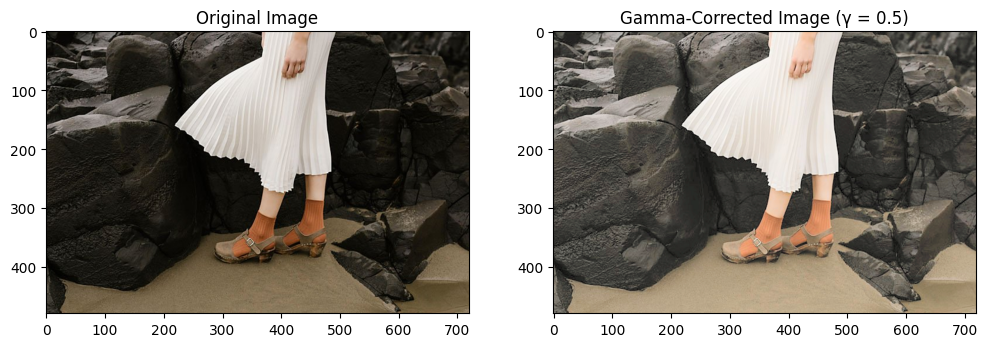

In [ ]:
# Load the input image from the specified file path
input_image = cv2.imread('/content/drive/MyDrive/a1images/highlights_and_shadows.jpg')

# Convert the image from BGR (OpenCV default) to RGB for displaying
input_image_rgb = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

# Convert the image from BGR to L*a*b* color space for gamma correction
lab_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2LAB)

# Split the L (lightness), a, and b channels
L_channel, a_channel, b_channel = cv2.split(lab_image)

# Normalize the L channel to range [0, 1] for performing gamma correction
L_norm = L_channel / 255.0

# Apply gamma correction (adjustable gamma value)
gamma_value = 0.5  # Adjust gamma as needed
L_gamma_corrected = np.power(L_norm, gamma_value)

# Scale the gamma-corrected L channel back to [0, 255]
L_gamma_corrected = np.uint8(L_gamma_corrected * 255)

# Merge the gamma-corrected L channel with the original a and b channels
lab_corrected_image = cv2.merge([L_gamma_corrected, a_channel, b_channel])

# Convert the LAB image back to BGR color space for visualization
output_image_bgr = cv2.cvtColor(lab_corrected_image, cv2.COLOR_LAB2BGR)
output_image_rgb = cv2.cvtColor(output_image_bgr, cv2.COLOR_BGR2RGB)

# Split the original and gamma-corrected RGB images into R, G, B channels
R_original, G_original, B_original = cv2.split(input_image_rgb)
R_corrected, G_corrected, B_corrected = cv2.split(output_image_rgb)

# Print the gamma value used in the correction process
print(f"Gamma value used: {gamma_value}")

# Display the original and gamma-corrected images side by side
plt.figure(figsize=(12, 6))

# Display the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(input_image_rgb)  # No need for further color conversion

# Display the gamma-corrected image
plt.subplot(1, 2, 2)
plt.title(f'Gamma-Corrected Image (γ = {gamma_value})')
plt.imshow(output_image_rgb)

plt.show()


### **b) Histograms of Original and corrected Images**

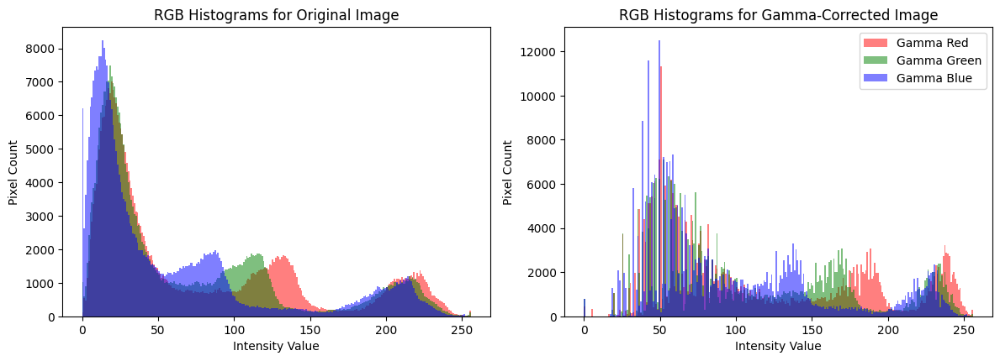

In [ ]:
# Plot the original image, gamma-corrected image, and RGB histograms in one figure
plt.figure(figsize=(12, 8))

# Plot RGB histograms for the original image
plt.subplot(2, 2, 3)
plt.title('RGB Histograms for Original Image')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

# Histogram for the original image's R, G, B channels
plt.hist(R_original.ravel(), bins=256, range=(0, 256), color='red', alpha=0.5, label='Original Red')
plt.hist(G_original.ravel(), bins=256, range=(0, 256), color='green', alpha=0.5, label='Original Green')
plt.hist(B_original.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.5, label='Original Blue')

# Plot RGB histograms for the gamma-corrected image
plt.subplot(2, 2, 4)
plt.title('RGB Histograms for Gamma-Corrected Image')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

# Histogram for the gamma-corrected image's R, G, B channels
plt.hist(R_corrected.ravel(), bins=256, range=(0, 256), color='red', alpha=0.5, label='Gamma Red')
plt.hist(G_corrected.ravel(), bins=256, range=(0, 256), color='green', alpha=0.5, label='Gamma Green')
plt.hist(B_corrected.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.5, label='Gamma Blue')

# Add legend to differentiate between original and gamma-corrected histograms
plt.legend(loc='upper right')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## **04) Increase the Vibrance of a Photograph**

### **a) Split the image into hue, saturation and value planes**

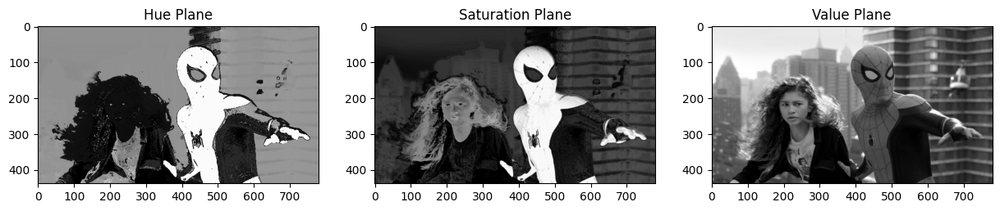

Min and Max of Hue Plane: 0, 179
Min and Max of Saturation Plane: 0, 185
Min and Max of Value Plane: 8, 231


In [138]:
# Read the image
spiderman_img = cv2.imread("/content/drive/MyDrive/a1images/spider.png")

# Convert the image into HSV color space
hsv_spiderman_img = cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2HSV)

# Split the image into hue, saturation, and value planes
spiderman_hue_plane = hsv_spiderman_img[:,:,0]
spiderman_saturation_plane = hsv_spiderman_img[:,:,1]
spiderman_value_plane = hsv_spiderman_img[:,:,2]

# Create a figure for hue, saturation, and value planes
plt.figure(figsize=(15, 5))

# Display the hue plane
plt.subplot(1, 3, 1)
plt.title('Hue Plane')
plt.imshow(spiderman_hue_plane, cmap="gray")


# Display the saturation plane
plt.subplot(1, 3, 2)
plt.title('Saturation Plane')
plt.imshow(spiderman_saturation_plane, cmap="gray")


# Display the value plane
plt.subplot(1, 3, 3)
plt.title('Value Plane')
plt.imshow(spiderman_value_plane, cmap="gray")


# Show the plots
plt.show()

# Print the min and max of each HSV plane
print(f"Min and Max of Hue Plane: {np.min(spiderman_hue_plane)}, {np.max(spiderman_hue_plane)}")
print(f"Min and Max of Saturation Plane: {np.min(spiderman_saturation_plane)}, {np.max(spiderman_saturation_plane)}")
print(f"Min and Max of Value Plane: {np.min(spiderman_value_plane)}, {np.max(spiderman_value_plane)}")


### **b) Apply the Intensity Transformation to the Saturation Plane**

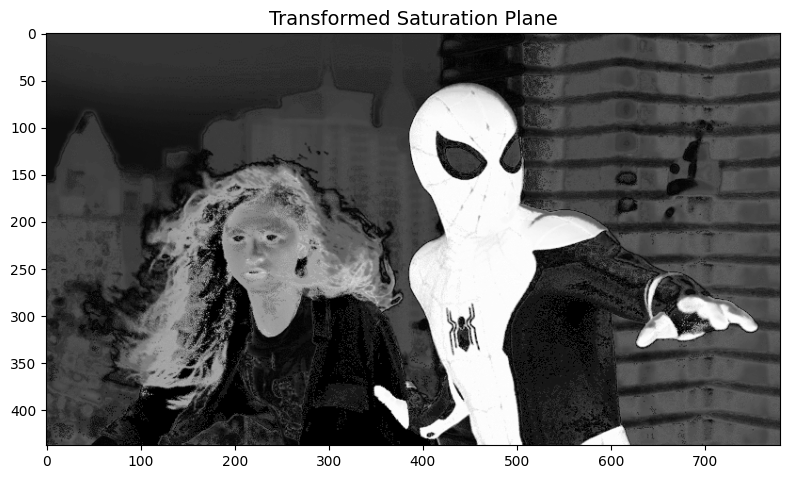

In [ ]:
# Define the vibrancy transformation function
def vibrancy_transformation_pix(input_pix_val:int, a:float, sigma:int=70)->float:
    x = input_pix_val
    return min(x + a*128*math.exp(-(x-128)**2/(2*sigma**2)), 255)

# Set the transformation parameter 'a' and apply it to the saturation plane
a = 0.5
new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)

# Apply vibrancy transformation to each pixel in the saturation plane
for i in range(spiderman_saturation_plane.shape[0]):
    for j in range(spiderman_saturation_plane.shape[1]):
        new_spiderman_saturation_plane[i][j] = vibrancy_transformation_pix(spiderman_saturation_plane[i][j], a=a)

# Create a figure to display the transformed saturation plane
plt.figure(figsize=(8, 6))

# Display the transformed saturation plane
plt.subplot(1, 1, 1)
plt.title("Transformed Saturation Plane", fontsize=14,)
plt.imshow(new_spiderman_saturation_plane, cmap="gray")

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

### **c) Adjust a to get a visually pleasing output for different a values**

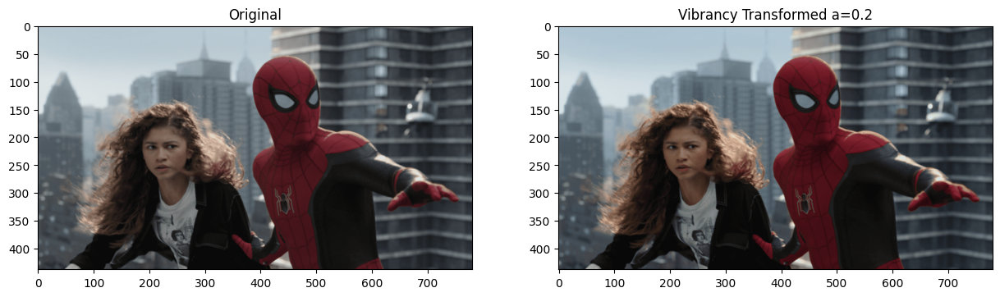

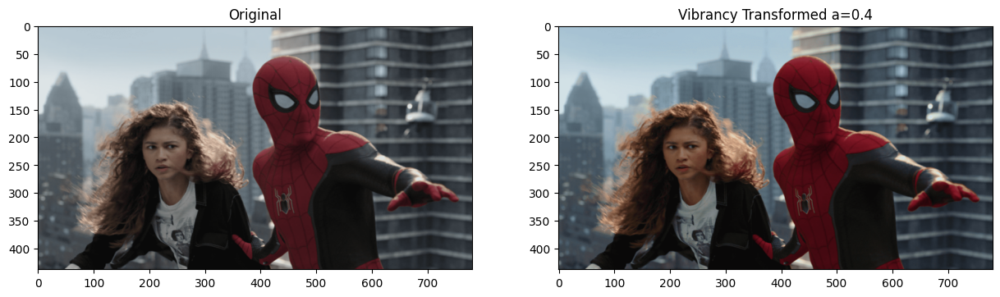

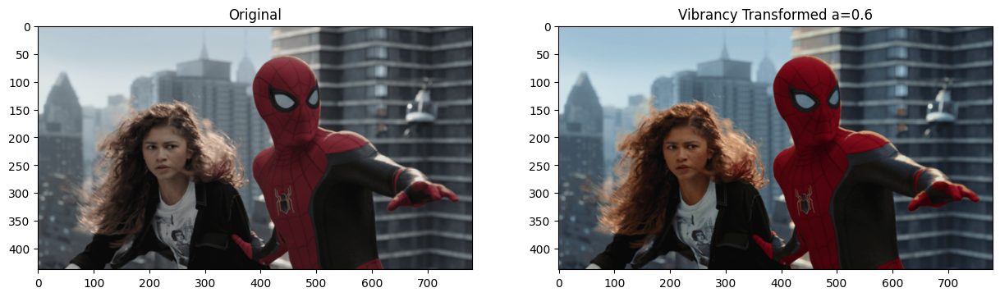

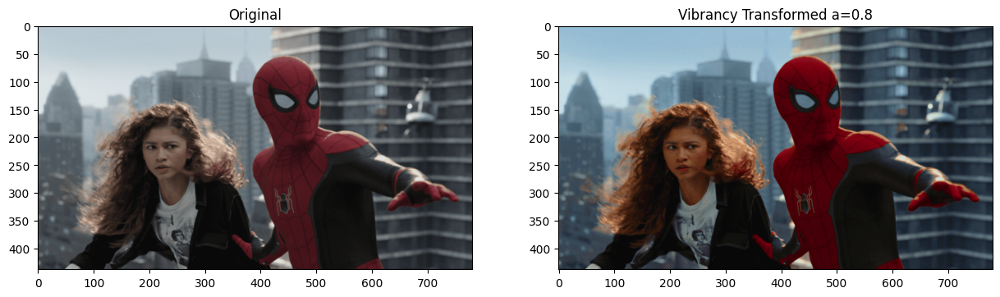

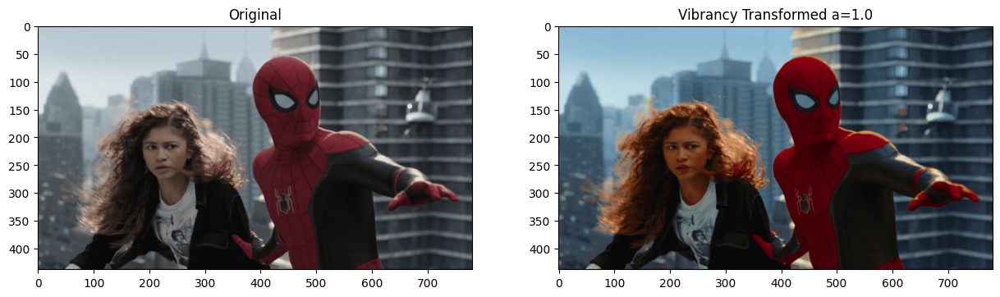

In [139]:
# Try different values of 'a' for visual output
a_values = [0.2, 0.4, 0.6, 0.8, 1.0]

hsv_images = {}

for a in a_values:
    # Apply vibrancy transformation to the saturation plane
    new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)
    for i in range(spiderman_saturation_plane.shape[0]):
        for j in range(spiderman_saturation_plane.shape[1]):
            new_spiderman_saturation_plane[i][j] = vibrancy_transformation_pix(spiderman_saturation_plane[i][j], a=a)

    # Combine the new saturation plane with the original hue and value planes
    new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

    # Convert the HSV image back to BGR color space
    new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

    # Store the transformed image in a dictionary for visualization
    hsv_images[a] = new_spiderman_img

    # Create subplots to compare original and transformed images
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

    # Plot the original image
    axs[0].set_title("Original")
    axs[0].imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))

    # Plot the vibrancy transformed image
    axs[1].set_title(f"Vibrancy Transformed a={a}")
    axs[1].imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))

    plt.show()


### **d) Recombine the three planes**

Value of a: 0.5


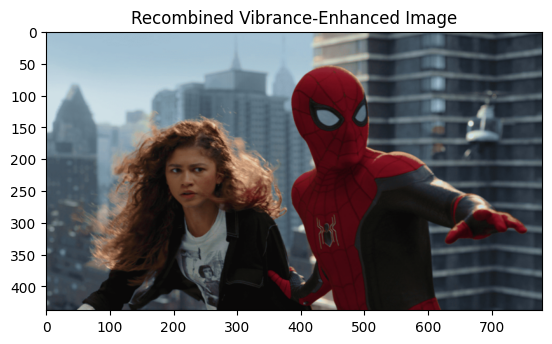

In [ ]:
# Set the optimal value of 'a' after visual adjustments
a = 0.5

print(f"Value of a: {a}")

# Apply vibrancy transformation to the saturation plane
new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)
for i in range(spiderman_saturation_plane.shape[0]):
    for j in range(spiderman_saturation_plane.shape[1]):
        new_spiderman_saturation_plane[i][j] = vibrancy_transformation_pix(spiderman_saturation_plane[i][j], a=a)

# Combine the new saturation plane with the original hue and value planes
new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

# Convert the HSV image back to BGR color space
new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

# Store the transformed image in a dictionary for visualization
hsv_images[a] = new_spiderman_img

# Recombine the hue, transformed saturation, and value planes
new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

# Convert the recombined image back to BGR color space
new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

# Display the recombined image
plt.imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))
plt.title("Recombined Vibrance-Enhanced Image")
plt.show()

### **e) Original image, Vibrance-enhanced image, and the Intensity Transformation**

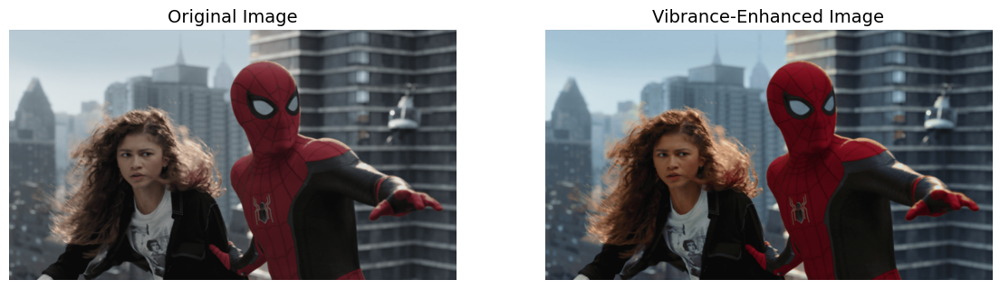

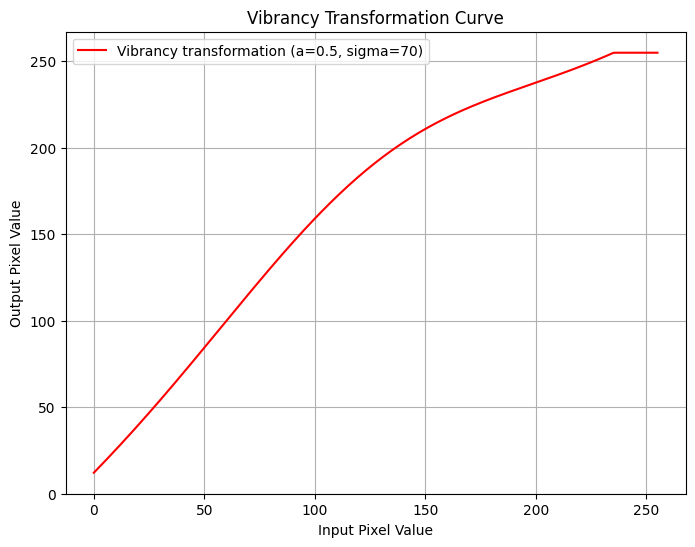

In [ ]:
# Create a figure to compare the original and vibrance-enhanced images
plt.figure(figsize=(14, 7))

# Display the original image
plt.subplot(1, 2, 1)
plt.title("Original Image", fontsize=14)
plt.imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Hide axes for a cleaner presentation

# Display the vibrance-enhanced image
plt.subplot(1, 2, 2)
plt.title("Vibrance-Enhanced Image", fontsize=14)
plt.imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Hide axes for a cleaner presentation

# Plot the intensity transformation curve
sigma = 70  # As per the problem definition
input_values = np.arange(0, 256)
output_values = [vibrancy_transformation_pix(x, a, sigma) for x in input_values]

plt.figure(figsize=(8, 6))
plt.plot(input_values, output_values, label=f'Vibrancy transformation (a={a}, sigma={sigma})', color='red')
plt.xlabel('Input Pixel Value')
plt.ylabel('Output Pixel Value')
plt.title('Vibrancy Transformation Curve')
plt.legend()
plt.grid(True)
plt.show()


## **05) Histogram Equalization**

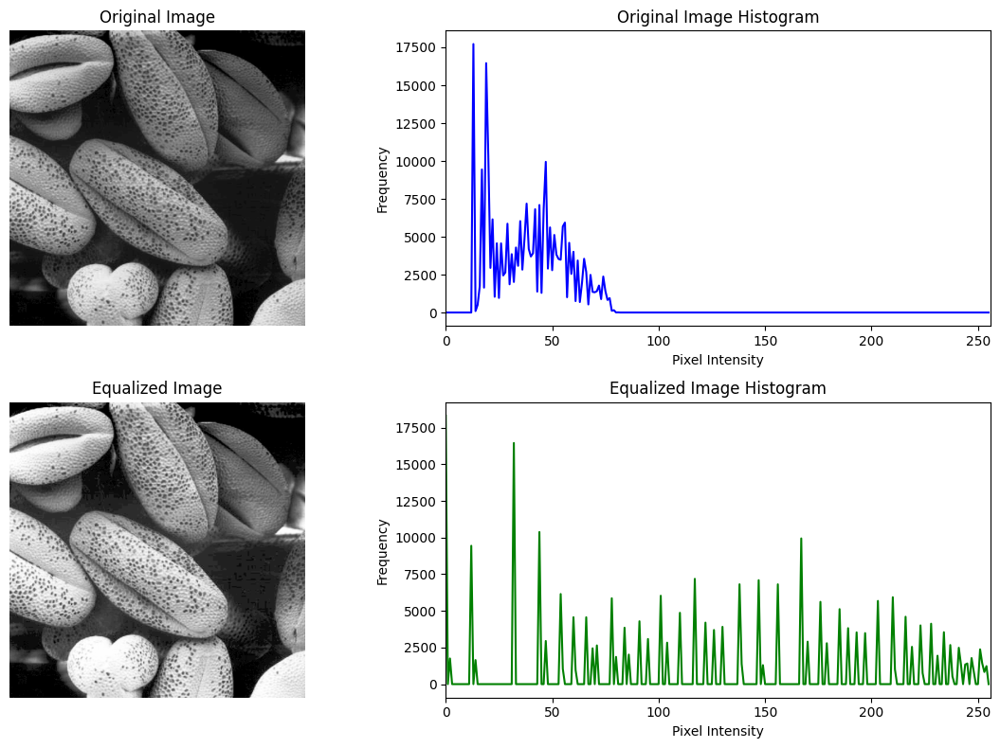

In [ ]:
def equalize_histogram(gray_img):
    """Apply histogram equalization to the grayscale image."""
    # Compute histogram of the input image
    histogram, bin_edges = np.histogram(gray_img.flatten(), bins=256, range=[0, 256])

    # Compute the cumulative distribution function (CDF)
    cdf_values = histogram.cumsum()

    # Mask zero intensity values and normalize the CDF
    cdf_masked = np.ma.masked_equal(cdf_values, 0)
    cdf_masked = (cdf_masked - cdf_masked.min()) * 255 / (cdf_masked.max() - cdf_masked.min())
    cdf_normalized = np.ma.filled(cdf_masked, 0).astype('uint8')

    # Map the CDF values back to the grayscale image
    img_equalized = cdf_normalized[gray_img]

    return img_equalized, histogram

# Example usage with a grayscale image
image= "/content/drive/MyDrive/a1images/shells.tif"
grayscale_image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)

# Apply histogram equalization to the image
equalized_image_result, original_hist_result = equalize_histogram(grayscale_image)

# Compute histogram for the equalized image
eq_histogram, _ = np.histogram(equalized_image_result.flatten(), bins=256, range=[0, 256])

# Create a figure to display images and histograms
plt.figure(figsize=(12, 8))

# Display the original image
plt.subplot(221)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Plot the histogram of the original image
plt.subplot(222)
plt.plot(original_hist_result, color='blue')
plt.title('Original Image Histogram')
plt.xlim([0, 256])
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

# Display the equalized image
plt.subplot(223)
plt.imshow(equalized_image_result, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

# Plot the histogram of the equalized image
plt.subplot(224)
plt.plot(eq_histogram, color='green')
plt.title('Equalized Image Histogram')
plt.xlim([0, 256])
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


## **06) apply histogram equalization only to the foreground of an image**

### **split it into hue, saturation, and values**

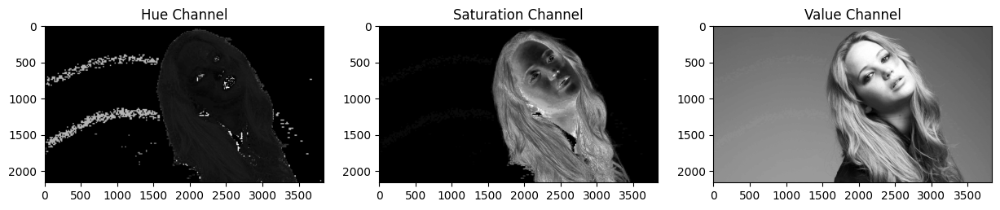

In [140]:
# Load the image
image = "/content/drive/MyDrive/a1images/jeniffer.jpg"
image = cv2.imread(image)

# Convert the image to HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Split HSV channels
hue_channel = hsv_image[:, :, 0]
saturation_channel = hsv_image[:, :, 1]
value_channel = hsv_image[:, :, 2]

# Display the channels
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(hue_channel, cmap='gray')
plt.title('Hue Channel')

plt.subplot(1, 3, 2)
plt.imshow(saturation_channel, cmap='gray')
plt.title('Saturation Channel')

plt.subplot(1, 3, 3)
plt.imshow(value_channel, cmap='gray')
plt.title('Value Channel')

plt.show()

### **Foreground mask**

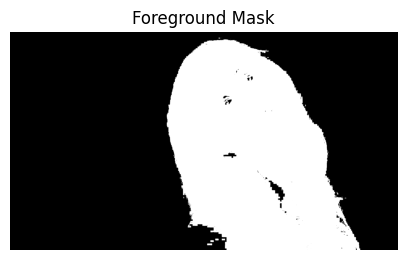

In [146]:
# Create a binary mask for the foreground based on saturation threshold
foreground_mask = saturation_channel > 14

# Display the foreground mask
plt.figure(figsize=(5, 5))
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.axis('off')
plt.show()


### **Compute the histogram**

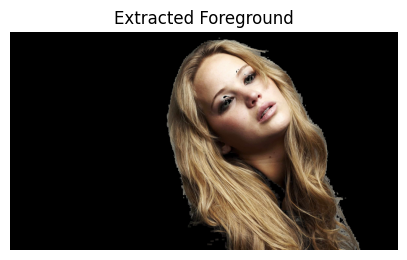

In [147]:
# Extract the foreground using bitwise AND
foreground_only = cv2.bitwise_and(image, image, mask=foreground_mask.astype(np.uint8))

# Compute histogram for each channel of the foreground
hist_blue = cv2.calcHist([foreground_only], [0], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_green = cv2.calcHist([foreground_only], [1], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_red = cv2.calcHist([foreground_only], [2], foreground_mask.astype(np.uint8), [256], [0, 256])

# Display the extracted foreground
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))
plt.title('Extracted Foreground')
plt.axis('off')
plt.show()


### **Obtain the cumulative sum of the histogram**

In [148]:
# Calculate cumulative histograms
cumulative_hist_blue = np.cumsum(hist_blue)
cumulative_hist_green = np.cumsum(hist_green)
cumulative_hist_red = np.cumsum(hist_red)

# Print cumulative histogram for blue channel
print("Cumulative Histogram Blue: \n", cumulative_hist_blue)

Cumulative Histogram Blue: 
 [  26760.   33302.   42469.   52584.   61324.   73001.   82935.   95310.
  108524.  122178.  141746.  155494.  188722.  204406.  225838.  254304.
  276505.  301898.  320269.  352247.  371576.  395921.  419858.  441229.
  466608.  486521.  510361.  533253.  553950.  578691.  598725.  622017.
  642357.  663577.  685689.  706038.  727353.  746859.  768658.  788359.
  807603.  828442.  847972.  868143.  887213.  906423.  926086.  944983.
  964047.  982725. 1001465. 1019970. 1038253. 1056264. 1074626. 1092491.
 1110056. 1127489. 1144977. 1161866. 1178810. 1195611. 1212137. 1228870.
 1244954. 1261530. 1277489. 1293714. 1309626. 1325563. 1341265. 1357094.
 1372715. 1388053. 1403475. 1419262. 1434906. 1450662. 1466241. 1481641.
 1496705. 1511708. 1526925. 1541820. 1556876. 1571814. 1586639. 1601302.
 1615932. 1630585. 1645205. 1659880. 1674762. 1689178. 1703857. 1718639.
 1733356. 1748079. 1762526. 1777432. 1791892. 1806465. 1820971. 1835534.
 1850217. 1864521. 187

### **Equalized Foreground**

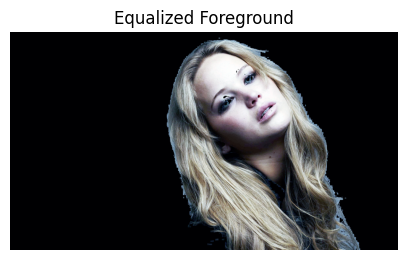

In [149]:
def equalize_cumulative_histogram(cum_hist, total_pixels):
    return ((cum_hist / total_pixels) * 255).astype(np.uint8)

# Get total number of foreground pixels
total_pixels = foreground_mask.astype(np.uint8).sum()

# Create lookup tables for each channel
lookup_table_blue = equalize_cumulative_histogram(cumulative_hist_blue, total_pixels)
lookup_table_green = equalize_cumulative_histogram(cumulative_hist_green, total_pixels)
lookup_table_red = equalize_cumulative_histogram(cumulative_hist_red, total_pixels)

# Apply equalization to the foreground
equalized_foreground = np.zeros_like(foreground_only)
equalized_foreground[:, :, 0] = cv2.LUT(foreground_only[:, :, 0], lookup_table_blue)
equalized_foreground[:, :, 1] = cv2.LUT(foreground_only[:, :, 1], lookup_table_green)
equalized_foreground[:, :, 2] = cv2.LUT(foreground_only[:, :, 2], lookup_table_red)

# Display equalized foreground
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(equalized_foreground, cv2.COLOR_BGR2RGB))
plt.title('Equalized Foreground')
plt.axis('off')
plt.show()


### **Final Result with Equalized Foreground**

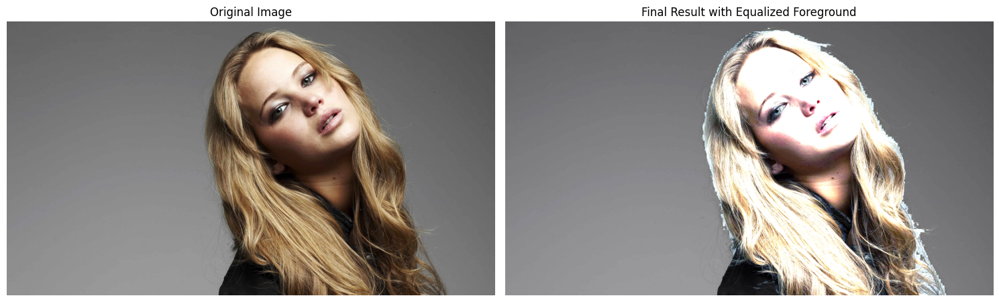

In [150]:
# Extract the background from the original image using the mask
background = cv2.bitwise_and(image, image, mask=cv2.bitwise_not(foreground_mask.astype(np.uint8)))

# Combine equalized foreground with original background
final_result = cv2.add(equalized_foreground, background)

# Display the final result
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
plt.title('Final Result with Equalized Foreground')
plt.axis('off')

plt.tight_layout()
plt.show()


### **All Images in steps**

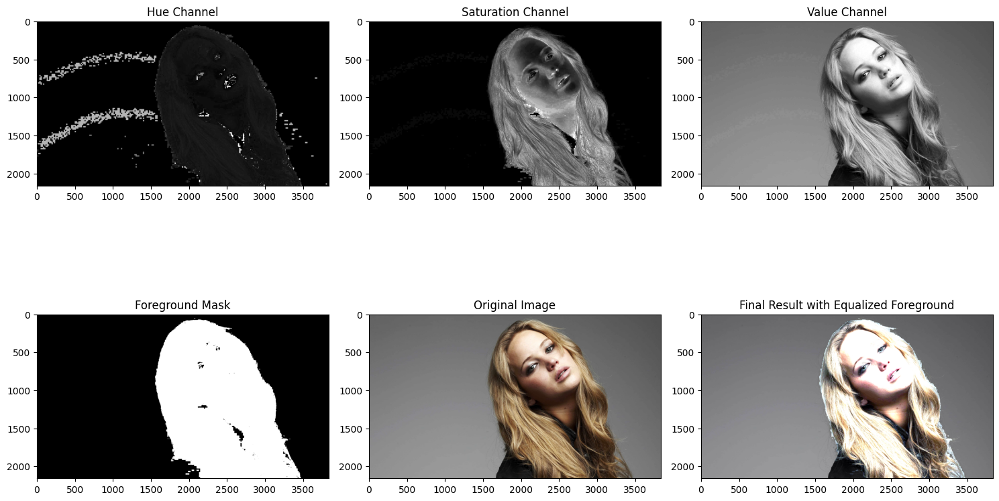

In [ ]:
# Display results
plt.figure(figsize=(15, 10))

# Display Hue channel
plt.subplot(2, 3, 1)
plt.imshow(hue_channel, cmap='gray')
plt.title('Hue Channel')

# Display Saturation channel
plt.subplot(2, 3, 2)
plt.imshow(saturation_channel, cmap='gray')
plt.title('Saturation Channel')

# Display Value channel
plt.subplot(2, 3, 3)
plt.imshow(value_channel, cmap='gray')
plt.title('Value Channel')

# Display Foreground Mask
plt.subplot(2, 3, 4)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')

# Display Original Image
plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Display Final Result
plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
plt.title('Final Result with Equalized Foreground')

plt.tight_layout()
plt.show()


## **07) Filtering with the Sobel operator**

### **filter2D to Sobel filter the image.**

Image shape: (380, 364)


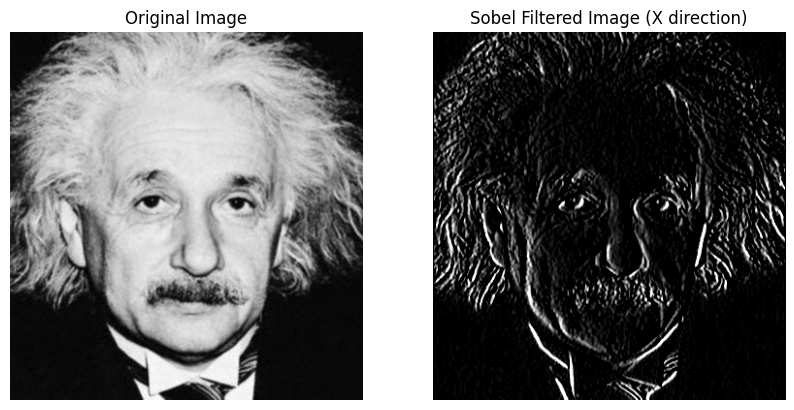

In [ ]:
# Load the grayscale image
einstein_img = cv2.imread("/content/drive/MyDrive/a1images/einstein.png", cv2.IMREAD_GRAYSCALE)

# Check the shape of the image
print("Image shape:", einstein_img.shape)

# Define the Sobel kernel for x direction
sobel_kernel_x = np.array([[-1, 0, 1],
                            [-2, 0, 2],
                            [-1, 0, 1]])

# Apply the Sobel filter using filter2D
sobel_filtered_x = cv2.filter2D(einstein_img, -1, sobel_kernel_x)

# Plot original and Sobel filtered image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(einstein_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_filtered_x, cmap='gray')
plt.title('Sobel Filtered Image (X direction)')
plt.axis('off')
plt.show()

### **Own code to Sobel filter the image**

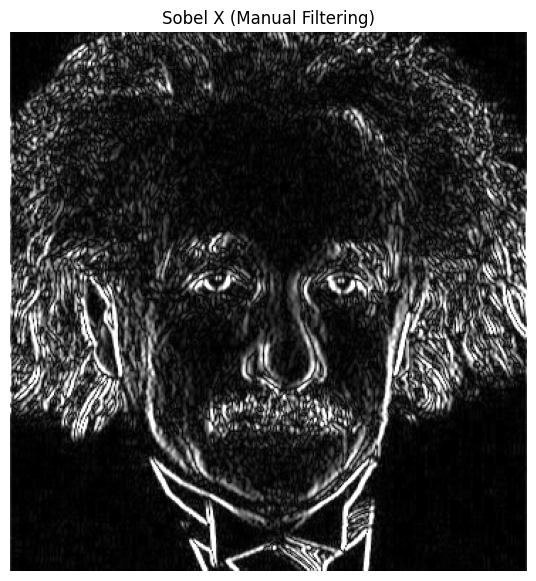

In [ ]:
# Initialize empty arrays to store Sobel results
sobel_x_manual = np.zeros_like(einstein_img, dtype=np.float64)

# Pad the image to handle edges
padded_img = np.pad(einstein_img, ((1, 1), (1, 1)), mode='constant')

# Perform convolution with the Sobel kernel manually
height, width = einstein_img.shape
for row in range(1, height + 1):
    for col in range(1, width + 1):
        # Extract the 3x3 region from the padded image
        region = padded_img[row-1:row+2, col-1:col+2]
        # Apply the Sobel kernel
        sobel_x_manual[row-1, col-1] = np.sum(sobel_kernel_x * region)

# Convert result to uint8 format
sobel_x_manual = np.uint8(np.clip(np.abs(sobel_x_manual), 0, 255))

# Plot the manually filtered image
plt.figure(figsize=(7, 7))
plt.imshow(sobel_x_manual, cmap='gray')
plt.title('Sobel X (Manual Filtering)')
plt.axis('off')
plt.show()

### **Using the property carry out Sobel filtering.**

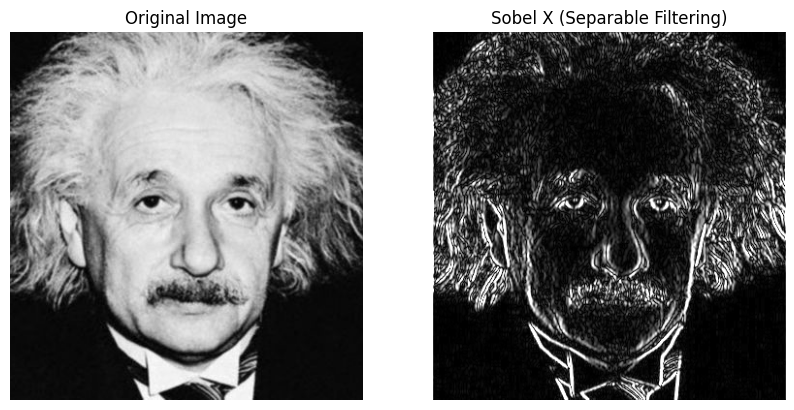

Sobel X Kernel:
 [[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


In [ ]:
# Define the 1D Sobel kernels
sobel_vertical = np.array([1, 2, 1])  # Vertical kernel for smoothing
sobel_horizontal = np.array([1, 0, -1])  # Horizontal kernel for edge detection

# Step 1: Apply vertical kernel to the image
sobel_intermediate = np.zeros_like(einstein_img, dtype=np.float64)
padded_img = np.pad(einstein_img, ((1, 1), (0, 0)), mode='constant')

for row in range(1, height + 1):
    for col in range(width):
        sobel_intermediate[row-1, col] = np.sum(padded_img[row-1:row+2, col] * sobel_vertical)

# Step 2: Apply horizontal kernel to the intermediate result
sobel_x_separable = np.zeros_like(einstein_img, dtype=np.float64)
padded_intermediate = np.pad(sobel_intermediate, ((0, 0), (1, 1)), mode='constant')

for row in range(height):
    for col in range(1, width + 1):
        sobel_x_separable[row, col-1] = np.sum(padded_intermediate[row, col-1:col+2] * sobel_horizontal)

# Convert result to uint8 format and clip values
sobel_x_separable = np.uint8(np.clip(np.abs(sobel_x_separable), 0, 255))

# Plot the result of separable Sobel filtering
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(einstein_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_x_separable, cmap='gray')
plt.title('Sobel X (Separable Filtering)')
plt.axis('off')
plt.show()

# Print the Sobel kernel for reference
print("Sobel X Kernel:\n", sobel_kernel_x)

## **08) Zoom Images**

Normalized SSD (Nearest Neighbor): 136.2691
Normalized SSD (Bilinear): 115.0919


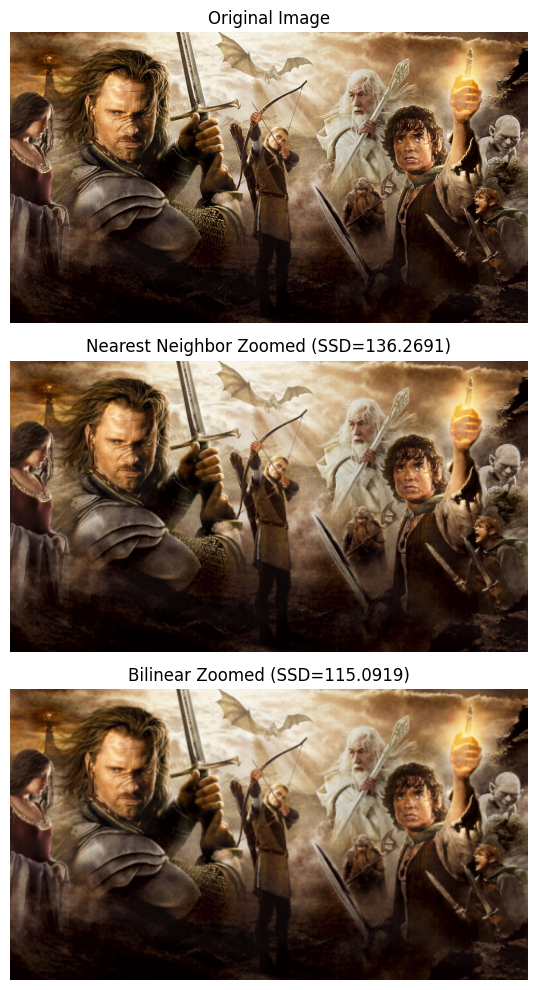

Normalized SSD (Nearest Neighbor): 26.4461
Normalized SSD (Bilinear): 18.3459


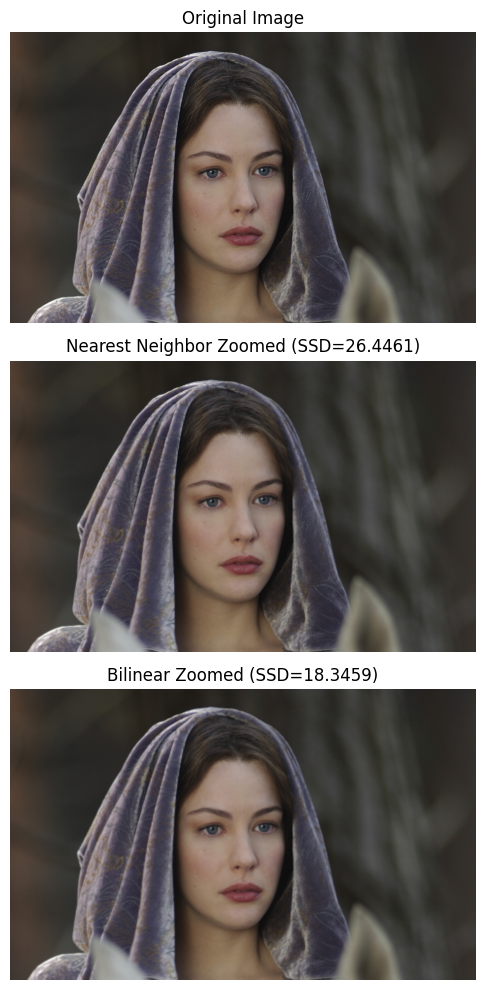

Normalized SSD (Nearest Neighbor): 67.5817
Normalized SSD (Bilinear): 51.2014


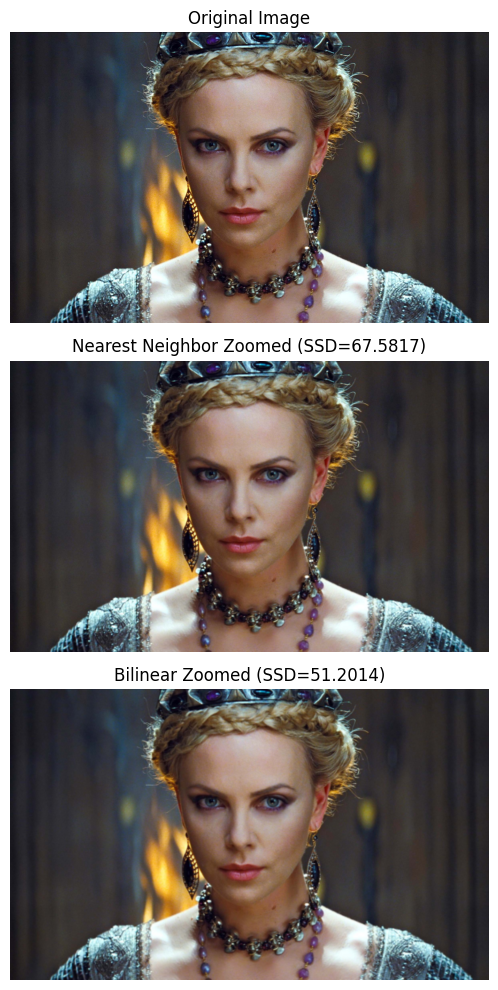

Normalized SSD (Nearest Neighbor): 228.6223
Normalized SSD (Bilinear): 197.4095


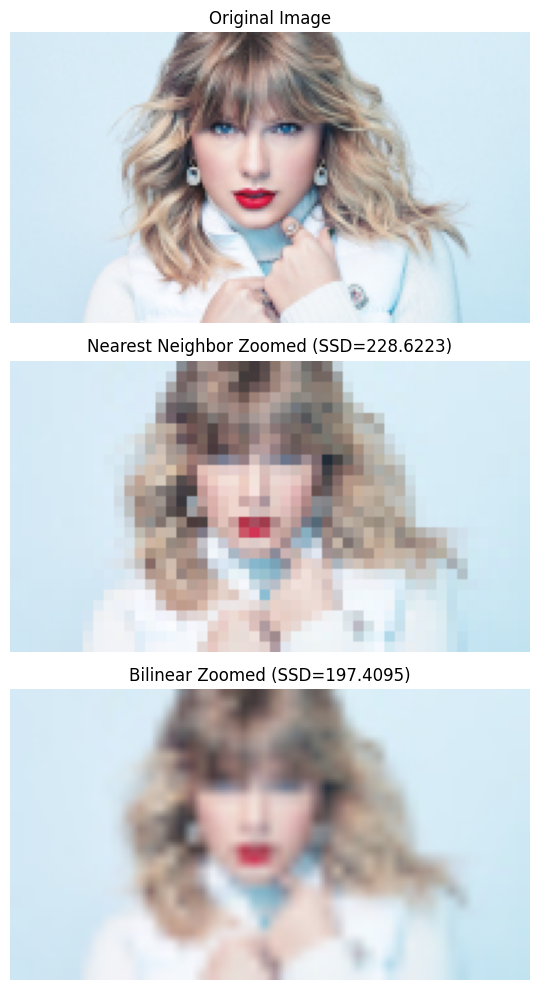

In [ ]:
# Function to zoom the image using specified interpolation method
def zoom_image(image, scale_factor, interpolation_method):
    new_size = (int(image.shape[1] * scale_factor), int(image.shape[0] * scale_factor))
    return cv2.resize(image, new_size, interpolation=interpolation_method)

# Function to compute the normalized sum of squared differences (SSD)
def compute_normalized_ssd(image1, image2):
    # Ensure the images are of the same size
    if image1.shape != image2.shape:
        min_height = min(image1.shape[0], image2.shape[0])
        min_width = min(image1.shape[1], image2.shape[1])
        image1 = image1[:min_height, :min_width]
        image2 = image2[:min_height, :min_width]

    ssd = np.sum((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)
    norm_ssd = ssd / np.prod(image1.shape)
    return norm_ssd

# Function to display images side-by-side
def display_images(original, nn_zoomed, bilinear_zoomed, titles):
    plt.figure(figsize=(15, 10))

    plt.subplot(3, 1, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(titles[0])
    plt.axis('off')

    plt.subplot(3, 1, 2)
    plt.imshow(cv2.cvtColor(nn_zoomed, cv2.COLOR_BGR2RGB))
    plt.title(titles[1])
    plt.axis('off')

    plt.subplot(3, 1, 3)
    plt.imshow(cv2.cvtColor(bilinear_zoomed, cv2.COLOR_BGR2RGB))
    plt.title(titles[2])
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to process zooming for given images
def process_zoom_and_display(small_image, large_image, scale_factor=4):
    # Zoom using nearest-neighbor interpolation
    nn_zoomed = zoom_image(small_image, scale_factor, cv2.INTER_NEAREST)

    # Zoom using bilinear interpolation
    bilinear_zoomed = zoom_image(small_image, scale_factor, cv2.INTER_LINEAR)

    # Compute normalized SSD for both zoomed images
    ssd_nn = compute_normalized_ssd(large_image, nn_zoomed)
    ssd_bilinear = compute_normalized_ssd(large_image, bilinear_zoomed)

    # Print out SSD values
    print(f"Normalized SSD (Nearest Neighbor): {ssd_nn:.4f}")
    print(f"Normalized SSD (Bilinear): {ssd_bilinear:.4f}")

    # Display images
    titles = [
        "Original Image",
        f"Nearest Neighbor Zoomed (SSD={ssd_nn:.4f})",
        f"Bilinear Zoomed (SSD={ssd_bilinear:.4f})"
    ]
    display_images(large_image, nn_zoomed, bilinear_zoomed, titles)

# Load images
im01_small = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im01small.png")
im01_large = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im01.png")

im02_small = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im02small.png")
im02_large = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im02.png")

im03_small = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im03small.png")
im03_large = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/im03.png")

taylor_very_small = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/taylor_very_small.jpg")
taylor_small = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/taylor_small.jpg")
taylor_large = cv2.imread("/content/drive/MyDrive/a1images/a1q5images/taylor.jpg")

# Process each image set
process_zoom_and_display(im01_small, im01_large, scale_factor=4)
process_zoom_and_display(im02_small, im02_large, scale_factor=4)
process_zoom_and_display(im03_small, im03_large, scale_factor=4)
process_zoom_and_display(taylor_very_small, taylor_small, scale_factor=4)


## **09) Segmentation**

### **a) GrabCut to segment the image**

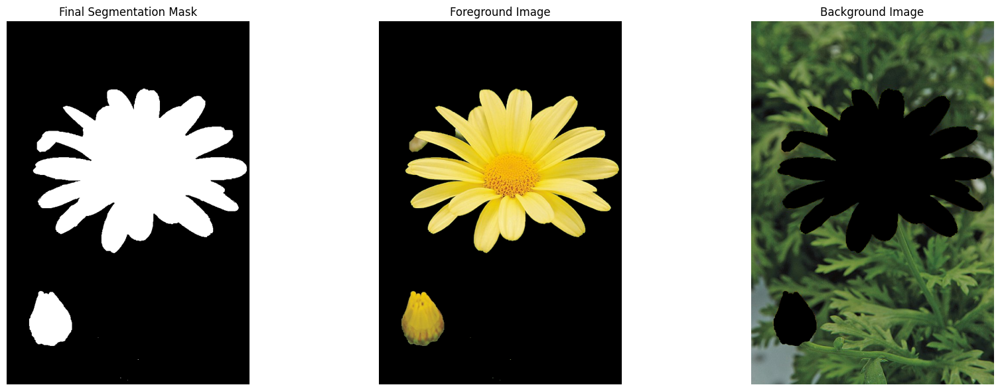

In [ ]:
# Load the daisy image
daisy_image = cv2.imread("/content/drive/MyDrive/a1images/daisy.jpg")

# Convert the image from BGR to RGB color space
daisy_image_rgb = cv2.cvtColor(daisy_image, cv2.COLOR_BGR2RGB)

# Create an initial mask for GrabCut
initial_mask = np.zeros(daisy_image.shape[:2], np.uint8)

# Create models for background and foreground
bg_model = np.zeros((1, 65), np.float64)
fg_model = np.zeros((1, 65), np.float64)

# Define the rectangle for the GrabCut algorithm
rect = (50, 50, daisy_image.shape[1] - 50, daisy_image.shape[0] - 50)  # Adjusted rectangle size

# Apply the GrabCut algorithm
cv2.grabCut(daisy_image, initial_mask, rect, bg_model, fg_model, 5, cv2.GC_INIT_WITH_RECT)

# Update the mask to segment the foreground
segmented_mask = np.where((initial_mask == 2) | (initial_mask == 0), 0, 1).astype('uint8')

# Extract the segmented foreground image
foreground_image = daisy_image_rgb * segmented_mask[:, :, np.newaxis]

# Extract the background image
background_image = daisy_image_rgb * (1 - segmented_mask[:, :, np.newaxis])

# Display the segmentation mask, foreground, and background images
plt.figure(figsize=(18, 6))

# Plot the final segmentation mask
plt.subplot(1, 3, 1)
plt.imshow(segmented_mask, cmap='gray')
plt.title('Final Segmentation Mask')
plt.axis('off')  # Hide axes for clarity

# Plot the foreground image
plt.subplot(1, 3, 2)
plt.imshow(foreground_image)
plt.title('Foreground Image')
plt.axis('off')  # Hide axes for clarity

# Plot the background image
plt.subplot(1, 3, 3)
plt.imshow(background_image)
plt.title('Background Image')
plt.axis('off')  # Hide axes for clarity

# Adjust layout for better spacing
plt.tight_layout()

# Display the plots
plt.show()

### **b) Produce an enhanced image with a blurred background**

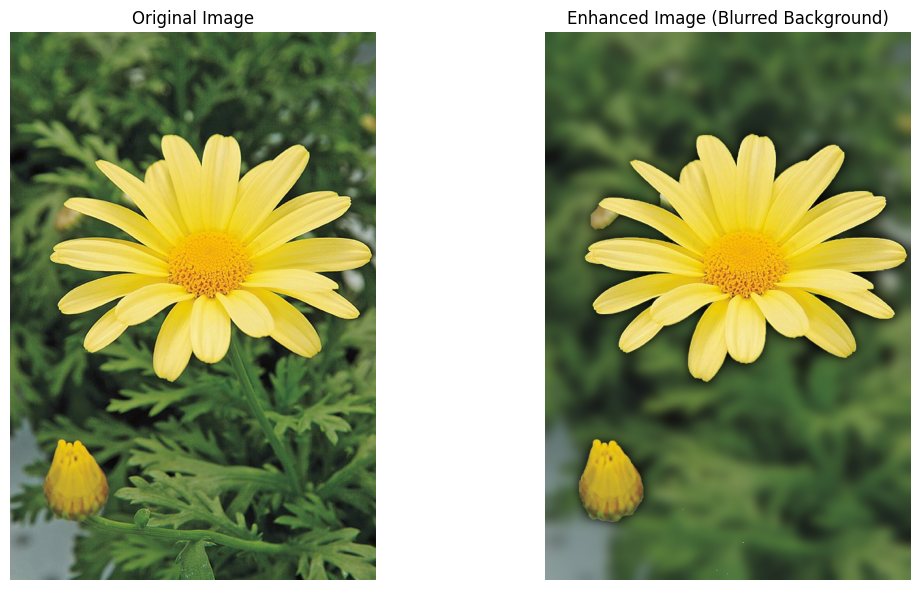

In [ ]:
# Apply Gaussian blur to the background image
blurred_background_image = cv2.GaussianBlur(background_image, (55, 55), 0)

# Combine the sharp foreground with the blurred background
enhanced_image_blurred_bg = np.where(segmented_mask[:, :, np.newaxis] == 1, daisy_image_rgb, blurred_background_image)

# Display the original and enhanced images with a different plotting style
plt.figure(figsize=(12, 6))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(daisy_image_rgb)
plt.title('Original Image')
plt.axis('off')  # Hide axes

# Plot the enhanced image with a blurred background
plt.subplot(1, 2, 2)
plt.imshow(enhanced_image_blurred_bg)
plt.title('Enhanced Image (Blurred Background)')
plt.axis('off')  # Hide axes

# Display the plots
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()